# Sentiment-based product recommendation system:

The e-commerce business is quite popular these days. Here, you do not need to take orders by going to each customer. A company launches its website to sell the items to the end consumer, and customers can order the products that they require from the same website. Here I have built a model that will improve the recommendations provided to the different users, given their past product reviews and ratings. 

Following steps have been taken to arrive at the final model:

1. Data sourcing and sentiment analysis
    - 1.1 Exploratory data analysis
    - 1.2 Data cleaning
    - 1.3 Text preprocessing 
    - 1.4 Feature extraction
    - 1.5 Training a text classification model *(DB: Data Balancing, HT: Hyperparameter Tuning)*
        - 1.5.1 Logistic regression (without DB or HT)
        - 1.5.2 Random forest (without DB or HT)
        - 1.5.3 XGBoost (without DB or HT)
        - 1.5.4 Naive Bayes (without DB or HT)
        - 1.5.5 Logistic regression (with DB)
        - 1.5.6 Random forest (with DB)
        - 1.5.7 XGBoost (with DB)
        - 1.5.8 Naive Bayes (with DB)
        - 1.5.9 Logistic regression (with HT)
        - 1.5.10 Random forest (with HT)
        - 1.5.11 XGBoost (with HT)
        - 1.5.12 Naive Bayes (with HT)
      
      
2. Building a recommendation system
    - 2.1 User-based recommendation system
    - 2.2 Item-based recommendation system
  

3. Improving the recommendations using the sentiment analysis model
  
  
4. Deploying the end-to-end project with a user interface

In [1]:
# importing dependencies

import numpy as np
import pandas as pd
pd.set_option('display.max_column',None)

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.probability import FreqDist
# nltk.download('universal_tagset')
# nltk.download('averaged_perceptron_tagger')

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, GridSearchCV 
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
import xgboost
from xgboost import XGBClassifier
from sklearn.naive_bayes import MultinomialNB

from joblib import dump, load

In [3]:
# loading the dataframe
df_main = pd.read_csv('/home/kevin/Desktop/Capstone/sample30.csv')

## 1. Data sourcing and sentiment analysis

### 1.1 Exploratory data analysis

In [ ]:
df_main.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,NaN,NaN,5,i love this album. it's very good. more to the...,Just Awesome,Los Angeles,NaN,joshua,Positive
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part...,Good,NaN,NaN,dorothy w,Positive
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,NaN,NaN,dorothy w,Positive
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,I read through the reviews on here before look...,Disappointed,NaN,NaN,rebecca,Negative
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel cau...,Irritation,NaN,NaN,walker557,Negative


In [ ]:
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   id                    30000 non-null  object
 1   brand                 30000 non-null  object
 2   categories            30000 non-null  object
 3   manufacturer          29859 non-null  object
 4   name                  30000 non-null  object
 5   reviews_date          29954 non-null  object
 6   reviews_didPurchase   15932 non-null  object
 7   reviews_doRecommend   27430 non-null  object
 8   reviews_rating        30000 non-null  int64 
 9   reviews_text          30000 non-null  object
 10  reviews_title         29810 non-null  object
 11  reviews_userCity      1929 non-null   object
 12  reviews_userProvince  170 non-null    object
 13  reviews_username      29937 non-null  object
 14  user_sentiment        29999 non-null  object
dtypes: int64(1), object(14)
memory usage

In [ ]:
# check for null values in different columns
df_main.isnull().sum().sort_values(ascending=False)

reviews_userProvince    29830
reviews_userCity        28071
reviews_didPurchase     14068
reviews_doRecommend      2570
reviews_title             190
manufacturer              141
reviews_username           63
reviews_date               46
user_sentiment              1
reviews_text                0
reviews_rating              0
name                        0
categories                  0
brand                       0
id                          0
dtype: int64

In [ ]:
df_main.describe(include='all')

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
count,30000,30000,30000,29859,30000,29954,15932,27430,30000.000000,30000,29810,1929,170,29937,29999
unique,271,214,270,227,271,6857,2,2,NaN,27282,18535,977,42,24914,2
top,AVpf3VOfilAPnD_xjpun,Clorox,"Household Essentials,Cleaning Supplies,Kitchen...",Clorox,Clorox Disinfecting Wipes Value Pack Scented 1...,2012-01-26T00:00:00.000Z,False,True,NaN,Great,Great Product,Chicago,CA,mike,Positive
freq,8545,10585,8545,8546,8545,1041,14498,25880,NaN,16,384,34,19,41,26632
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.483133,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.988441,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,NaN,NaN,NaN,NaN


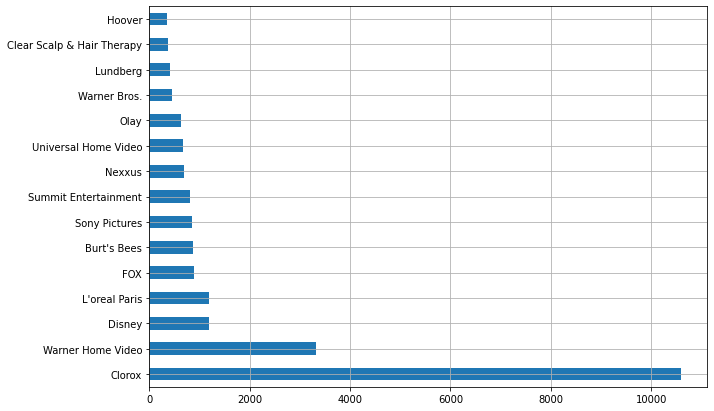

In [ ]:
# checking for count-wise top 15 brand products 
plt.figure(figsize=(10,7))
df_main['brand'].value_counts().sort_values(ascending=False)[:15].plot.barh()
plt.grid()
plt.show()

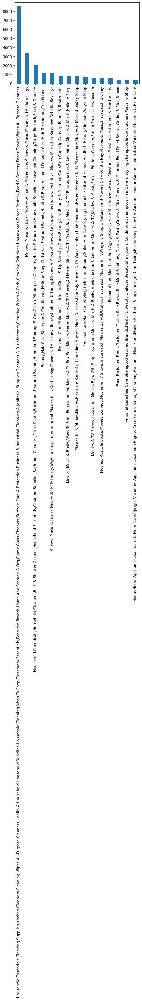

In [ ]:
# checking count-wise top 15 product categories
df_main['categories'].value_counts().sort_values(ascending=False)[:15].plot.bar()
plt.show()

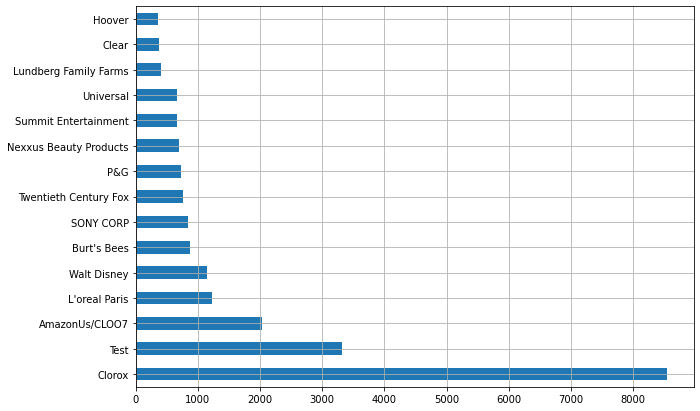

In [ ]:
# checking for count-wise top 15 product manufacturers
plt.figure(figsize=(10,7))
df_main['manufacturer'].value_counts().sort_values(ascending=False)[:15].plot.barh()
plt.grid()
plt.show()

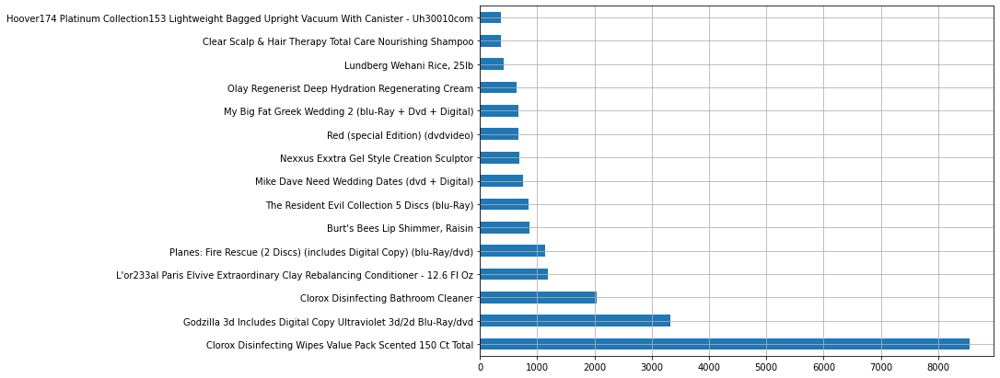

In [ ]:
# checking for count-wise top 15 product names
plt.figure(figsize=(10,7))
df_main['name'].value_counts().sort_values(ascending=False)[:15].plot.barh()
plt.grid()
plt.show()

In [ ]:
# checking purchase statistics
df_main['reviews_didPurchase'].value_counts(dropna=False)

False    14498
NaN      14068
True      1434
Name: reviews_didPurchase, dtype: int64

In [ ]:
# cheking recommend statistics
df_main['reviews_doRecommend'].value_counts(dropna=False)

True     25880
NaN       2570
False     1550
Name: reviews_doRecommend, dtype: int64

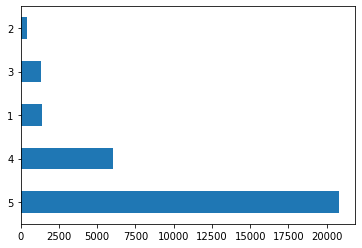

In [ ]:
# checking the distribution of different ratings given by users
df_main['reviews_rating'].value_counts(dropna=False).plot.barh()
plt.show()

From above, we note that more customers tend to give higher ratings.

In [ ]:
# checking count-wise top 20 review titles
df_main['reviews_title'].apply(lambda i:str(i).lower()).value_counts(dropna=False)[:20]

great product        744
great movie          664
clorox wipes         511
good movie           339
great                320
awesome              263
love it              214
nan                  190
love it!             165
great product!       161
clorox               159
good                 144
wipes                141
excellent            141
five stars           117
awesome product      103
love this product    102
good product         102
love                 100
great movie!          98
Name: reviews_title, dtype: int64

In [ ]:
# checking top users
df_main['reviews_username'].apply(lambda i:str(i).lower()).value_counts(dropna=False)

nan                  63
byamazon customer    41
mike                 41
chris                32
lisa                 16
                     ..
cocoa112              1
peaches321            1
texasmom1009          1
dawn242               1
zchandyman            1
Name: reviews_username, Length: 24915, dtype: int64

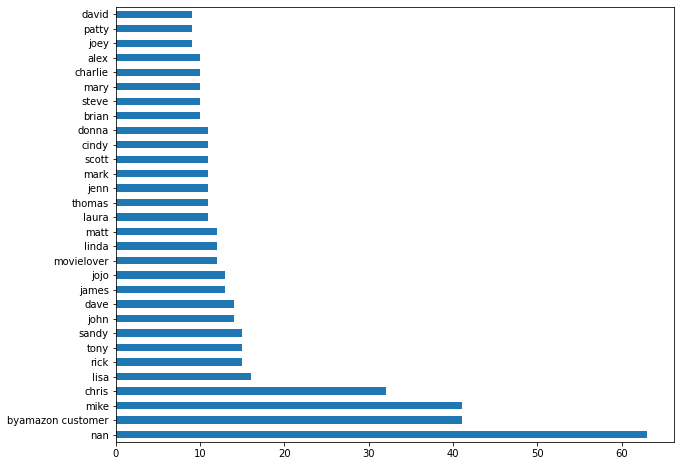

In [ ]:
# check for different user purchase-review counts
plt.figure(figsize=(10,8))
df_main['reviews_username'].apply(lambda i:str(i).lower()).value_counts(dropna=False)[:30].plot.barh()
plt.show()

In [ ]:
# checking user sentiment distribution 
df_main['user_sentiment'].value_counts(dropna=False, normalize=True)

Positive    0.887733
Negative    0.112233
NaN         0.000033
Name: user_sentiment, dtype: float64

From above, we note that 88% reviews are positive, 11% reviews are negative and rest are not-known.

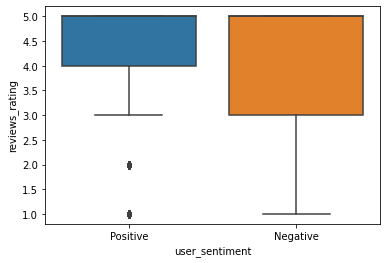

In [ ]:
# check distribution of different ratings for positive and negative user sentiments
sns.boxplot(x=df_main['user_sentiment'], y=df_main['reviews_rating'])
plt.show()

It is apparent from the above that Reviews with positive sentiment have relatively higher ratings as compared to the reviews with negative sentiment.

### 1.2 Data cleaning

In [ ]:
# check for duplicate rows and dropping them, if found

df_main.duplicated().sum()

0

**Drop Decisions:**<br>
`id:` We already have *name* column, so we drop this column. <br>
`brand:`We would recommend *name* of product hence this column is of no use, so we drop it.<br>
`categories:`We would recommend *name* of product hence this column is of no use, so we drop it.<br>
`manufacturer:`We would recommend *name* of product hence this column is of no use, so we drop it.<br>
`reviews_date:`This column would not aid in making recommendations, hence we drop it.<br>
`reviews_didPurchase:`Non-buyers can also provide product reviews on our website and we use those reviews for our recommendation system. Hence we can not filter customers based on this column, so we drop it.<br>
`reviews_doRecommend:`This column is not important as we would do not give importance to user-given recommendations, so we drop it.<br>
`reviews_userProvince:`Geographic information doesn't play role here, so we drop it.<br>
`reviews_userCity:`Geographic information doesn't play role here, so we drop it.<br>

In [4]:
# dropping the unnecessary columns, as per above deliberations

df_main.drop(['id','brand','categories', 'manufacturer', 
              'reviews_date','reviews_didPurchase', 'reviews_doRecommend',
              'reviews_userProvince', 'reviews_userCity'], axis=1, inplace=True)

In [5]:
# check for null values in remaining columns
df_main.isnull().sum().sort_values(ascending=False)

reviews_title       190
reviews_username     63
user_sentiment        1
name                  0
reviews_rating        0
reviews_text          0
dtype: int64

In [6]:
# impute NANs in 'reviews_title' column with '', as we would use this column for sentiment analysis

df_main['reviews_title'] = df_main['reviews_title'].apply(lambda i:'' if str(i)=='nan' else i)

We can use `reviews_title` and `reviews_text` columns for our sentiment analysis and compare the predictions with `user_sentiment` column. Let's create a seperate dataframe for ease of anlysis.

In [7]:
# creating new dataframe called 'df' for sentiments analysis
df = df_main[['reviews_title','reviews_text', 'user_sentiment']]
df.shape

(30000, 3)

In [8]:
# check for null values in different columns of 'df'
df.isnull().sum().sort_values(ascending=False)

user_sentiment    1
reviews_title     0
reviews_text      0
dtype: int64

In [9]:
# dropping NaN values in df
df.dropna(axis=0, inplace=True)
df.shape

(29999, 3)

In [10]:
# check for duplicates in entire 'df'
df.duplicated().sum()

984

In [11]:
# dropping duplicates from 'df'
df.drop_duplicates(inplace=True)

In [12]:
# check for duplicates subsetting over 'reviews_text' column in entire 'df'
df.duplicated(subset='reviews_text').sum()

1733

In [13]:
# dropping duplicates subsetting over 'reviews_text' column from 'df'
df.drop_duplicates(subset='reviews_text', inplace=True)

In [14]:
# concatenate 'reviews_title' and 'reviews_text' columns with '. ' into new column for sentiment analysis
# we use '. ' in 'reviews_title' column for ease in POS tagging by the tagger

df['text_concat'] = df['reviews_title'] + '. ' + df['reviews_text']

In [15]:
df.head()

,reviews_title,reviews_text,user_sentiment,text_concat
0,Just Awesome,i love this album. it's very good. more to the...,Positive,Just Awesome. i love this album. it's very goo...
1,Good,Good flavor. This review was collected as part...,Positive,Good. Good flavor. This review was collected a...
2,Good,Good flavor.,Positive,Good. Good flavor.
3,Disappointed,I read through the reviews on here before look...,Negative,Disappointed. I read through the reviews on he...
4,Irritation,My husband bought this gel for us. The gel cau...,Negative,Irritation. My husband bought this gel for us....


### 1.3 Text preprocessing

Following steps have been taken for processing of the text column `text_concat`

- tokenisation
- punctuation and stopwords removal
- noise removal
- spell correction

In [16]:
df['text_concat']

0        Just Awesome. i love this album. it's very goo...
1        Good. Good flavor. This review was collected a...
2                                       Good. Good flavor.
3        Disappointed. I read through the reviews on he...
4        Irritation. My husband bought this gel for us....
                               ...                        
29995    Softness!!. I got this conditioner with Influe...
29996    I love it. I love it , I received this for rev...
29997    Hair is so smooth after use. First of all I lo...
29998    Perfect for my oily hair!. I received this thr...
29999    Conditioned into healthy. I received this prod...
Name: text_concat, Length: 27282, dtype: object

In [17]:
# tokanize 'text_concat' column and
# using RegexpTokenizer('\w+') to remove all the punctuations and whitespaces

tokenizer = RegexpTokenizer('\w+')

df['text_concat'] = df['text_concat'].apply(lambda i:tokenizer.tokenize(i))

In [18]:
df['text_concat']

0        [Just, Awesome, i, love, this, album, it, s, v...
1        [Good, Good, flavor, This, review, was, collec...
2                                     [Good, Good, flavor]
3        [Disappointed, I, read, through, the, reviews,...
4        [Irritation, My, husband, bought, this, gel, f...
                               ...                        
29995    [Softness, I, got, this, conditioner, with, In...
29996    [I, love, it, I, love, it, I, received, this, ...
29997    [Hair, is, so, smooth, after, use, First, of, ...
29998    [Perfect, for, my, oily, hair, I, received, th...
29999    [Conditioned, into, healthy, I, received, this...
Name: text_concat, Length: 27282, dtype: object

In [19]:
# function to find unique words in the entire 'text_concat' column

def get_unique_words(df_col):
    all_word = []
    for i in range(df_col.shape[0]):
        all_word = all_word + df_col.iloc[i]
    print('no. unique of words: ', len(set(all_word)))
    return set(all_word)

In [ ]:
# checking the unique words  
get_unique_words(df['text_concat'])

no. unique of words:  24495


{'interspersed',
 'Tasted',
 'yard',
 'Jayne',
 'Buzzbuzzbuzz',
 'jerseygirl58',
 'redesigned',
 'ergonomics',
 'shattering',
 'dark',
 'MUTOs',
 'Blend',
 'backpacking',
 'cupcakes',
 'upscaled',
 'flavorWill',
 'transplants',
 'Barnabas',
 'PREVIOUS',
 'slime',
 'Half',
 'luvs',
 'Pantry',
 'YEAH',
 'Lorealhair',
 'seasoning',
 'Nabisco',
 'assault',
 'Carrot',
 'complains',
 'clumsy',
 'Rescue',
 'led',
 'SOMETIMES',
 'relieves',
 'shenanigans',
 'procedures',
 'Nia',
 'magda',
 'pixie',
 'Rinsed',
 'aren',
 'gaming',
 '22s',
 'crusted',
 'Kendick',
 'lookingh',
 'heavily',
 'Larger',
 'Itchy',
 'Rebalancing',
 'childrens',
 'from',
 'practically',
 '30s',
 'map',
 'Dissappointed',
 'exercises',
 'taping',
 'acction',
 'tingle',
 'bookkeeping',
 'frozen',
 'reading',
 'Except',
 'Mel',
 'CARTS',
 'admirably',
 'Platium',
 'Redo',
 'including',
 'assortment',
 'Shimmer',
 'rare',
 'musky',
 'appears',
 'Clearance',
 'SIDED',
 'Sunday',
 'discussion',
 'dies',
 'promotion',
 'thoughtf

In [19]:
nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Unzipping taggers/universal_tagset.zip.


True

In [20]:
# remove words with NUM and OTHERS (X) POS tags from text as they do not serve purpose for sentiment analysis

df['text_concat'] = df['text_concat'].apply(lambda i:[x[0] for x in nltk.pos_tag(i, tagset='universal') 
                                    if x[1] not in ['NUM', 'X']])

In [ ]:
# checking the unique words left 
w1 = get_unique_words(df['text_concat'])

no. unique of words:  24042


In [21]:
# lower case all the characters in 'text_concat' column

df['text_concat'] = df['text_concat'].apply(lambda i:[x.lower() for x in i])

In [ ]:
# checking the unique words left 
w2 = get_unique_words(df['text_concat'])

no. unique of words:  18144


In [ ]:
# following words have been corrected using lower casing
print(w1.difference(w2))

{'Movire', 'Residents', 'Tasted', 'Tuscany', 'Jayne', 'Taylor', 'Buzzbuzzbuzz', 'Plains', 'DeeW', 'Army', 'Believable', 'Weight', 'MUTOs', 'Developed', 'amaZing', 'Blend', 'LIFETIME', 'SIZE', 'ENTER', 'flavorWill', 'PTO', 'Barnabas', 'Did', 'PREVIOUS', 'LOL', 'Cord', 'Half', 'Pantry', 'Preserve', 'YEAH', 'Lorealhair', 'FORMULATE', 'Sauve', 'Nabisco', 'Carrot', 'Rescue', 'Holtz', 'SOMETIMES', 'Aboslutely', 'OFF', 'Nia', 'Arabia', 'Winter', 'nOT', 'VACATION', 'LIPS', 'Rinsed', 'Contains', 'Cetaphil', 'Simmer', 'Pink', 'Eh', 'DP', 'Minus', 'Wiped', 'VapoRub', 'Whips', 'Pancakes', 'Kendick', 'Surpassed', 'Cusinart', 'Horror', 'APPLIED', 'GrandKids', 'Larger', 'Itchy', 'Rebalancing', 'Detective', 'DAYS', 'Gross', 'Dissappointed', 'Saved', 'Medium', 'GREAT', 'Xclusive', 'OTHERS', 'Security', 'Lately', 'Smack', 'Boght', 'productS', 'ACTOR', 'Except', 'Operative', 'Mel', 'CARTS', 'Platium', 'Chico', 'Melodies', 'Redo', 'Malin', 'Cleassic', 'UHD', 'Shimmer', 'Studios', 'wellGreat', 'YRS', 'Brig

In [22]:
# remove stopwords from the 'text_concat' column

import nltk
nltk.download('stopwords')
eng_stops = stopwords.words('english')

df['text_concat'] = df['text_concat'].apply(lambda i:[x for x in i if x not in eng_stops])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# checking the unique words left 
w3 = get_unique_words(df['text_concat'])

no. unique of words:  17995


In [ ]:
# following words have been removed by removing stopwords
print(w2.difference(w3))

{'below', 'you', 'of', 'over', 'between', 'will', 'at', 'there', 't', 'against', 'where', 'by', 'what', 'for', 'd', 'my', 'out', 's', 'before', 'up', 'an', 'how', 'hadn', 'through', 'weren', 'after', 'did', 'these', 'is', 'being', 'them', 'why', 'been', 'who', 'each', 'her', 'ours', 'y', 'some', 'am', 'he', 'don', 'while', 'your', 'has', 'if', 'once', 'ma', 'hasn', 'wouldn', 'our', 'only', 'then', 'yourself', 'nor', 'most', 'haven', 'be', 'does', 'aren', 'didn', 'such', 'this', 'having', 'the', 'theirs', 'she', 'when', 'into', 'themselves', 'down', 'on', 'just', 'again', 'few', 'hers', 'above', 'from', 'that', 'too', 'wasn', 'o', 'than', 'doing', 'their', 'was', 'me', 'they', 'doesn', 'here', 'about', 'm', 'do', 'now', 'yourselves', 'off', 'isn', 'ain', 'himself', 'so', 'until', 'couldn', 'not', 'herself', 'are', 'we', 'its', 'and', 'as', 'any', 'll', 'own', 'his', 'itself', 'in', 'under', 'it', 'during', 'all', 've', 'were', 'further', 'more', 'which', 're', 'because', 'ourselves', 'h

In [23]:
# removal of alphanumeric, numeric words from text

df['text_concat'] = df['text_concat'].apply(lambda i:[x for x in i if x.isalpha()])

In [ ]:
# checking the unique words left 
w4 = get_unique_words(df['text_concat'])

no. unique of words:  17875


In [ ]:
# following words have been removed by filtering in only alphabetic words
print(w3.difference(w4))

{'wifey12', 'html0mgai5a4lulbzwho', 'c16', '60s', 'karenlee13', 'u1l2d1', 'fr9m', 'jerseygirl58', 'birdie278', 'rice2', 'q1', 't1', 'refsr11aitieutf8qid1479583761sr8', 'c18', '19th', 'sg1', 'sp4', 'red2', 'sr1', 'car3e', 'movie_even', 'px50s', 'josie225', 'ps4', '4th', 'peaches59', 'vo5', 'b1', 'x24', '4k', 'u6485900', 'rx7', 'va5foomhiiibyabv', 'clean411', 'befor3e', 'spf4', '2nd', 'x4', 'godzilla3d', 'emk1', 'planes2', 'one1', 'pob861', 'by2', 'sg1s', 'jp1', 'missie123', '1980s', 'uh30010com', 'tigerlily333', 'u6439', 'savvysaver25', 'te79', 'b0012s8vhs', 'p243t', 'leaf1', 'recie55', 'olay11', 'joe59', 'the5', 'teri55', 'godzilla11', '20th', 'broth1', 'parts3', 'c12', 'clean601', '1st', 's2', 'the1998', 'barbie58', 'stacey77', 'a19', 's3cond', '21st', 'v____', 'a1', 'tellpj1', 'mbfgw2', 't55', '60th', 'u5753', 'trying2dobetter2015', 'cloroxlover4eva', 'ogg1', 'every1', 'rea3', 'cox16930', 'b3', 'smiley360', '5th', 'good2go', 'chaywood716', 'product1', 'u6465', 'gu24', 'sh10000', 'car

In [24]:
# building a one-edit based spell corrector for rectification in spelling errors
nltk.download('brown')
import re
from collections import Counter
from nltk.corpus import brown


# create a frequency table of all the words of the document
all_words = Counter(brown.words())

def edits_one(word):
    "Create all edits that are one edit away from `word`."
    alphabets    = 'abcdefghijklmnopqrstuvwxyz'
    splits     = [(word[:i], word[i:])                   for i in range(len(word) + 1)]
    deletes    = [left + right[1:]                       for left, right in splits if right]
    inserts    = [left + c + right                       for left, right in splits for c in alphabets]
    replaces   = [left + c + right[1:]                   for left, right in splits if right for c in alphabets]
    transposes = [left + right[1] + right[0] + right[2:] for left, right in splits if len(right)>1]
    return set(deletes + inserts + replaces + transposes)

def known(words):
    "The subset of `words` that appear in the `all_words`."
    return set(word for word in words if word in all_words)

def possible_corrections(word):
    "Generate possible spelling corrections for word."
    return (known([word]) or known(edits_one(word)) or [word]) #or known(edits_two(word)) 

def prob(word, N=sum(all_words.values())): 
    "Probability of `word`: Number of appearances of 'word' / total number of tokens"
    return all_words[word] / N

def rectify(word):
    "return the most probable spelling correction for `word` out of all the `possible_corrections`"
    correct_word = max(possible_corrections(word), key=prob)
    return correct_word

[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Unzipping corpora/brown.zip.


In [25]:
# correcting the spellings with the above built spell corrector

df['text_concat'] = df['text_concat'].apply(lambda i:[rectify(x) for x in i])

In [ ]:
# checking the unique words left 
w5 = get_unique_words(df['text_concat'])

no. unique of words:  14546


In [ ]:
# following words have been correctedby spell corrector
print(w4.difference(w5))

{'percieved', 'glues', 'roman', 'hae', 'tiem', 'bj', 'draggy', 'noticeda', 'lt', 'protagonists', 'haters', 'colour', 'weard', 'abrey', 'fios', 'jan', 'landscaper', 'researched', 'tickle', 'zippers', 'muvh', 'thye', 'damped', 'ths', 'rinsed', 'pleaase', 'depo', 'greay', 'ilike', 'doggy', 'remade', 'masive', 'transplants', 'sre', 'chewy', 'electrics', 'degrease', 'cean', 'mof', 'diferent', 'skeptic', 'ghee', 'chamapagne', 'coily', 'casement', 'affter', 'wheres', 'cruddy', 'slime', 'lynk', 'leamon', 'livin', 'locals', 'frangrance', 'aterwards', 'linx', 'pretry', 'rediculous', 'vlassroom', 'sam', 'pase', 'loes', 'wipers', 'bathrooom', 'celan', 'escpecially', 'cerave', 'nthing', 'useing', 'ae', 'familys', 'evry', 'similiar', 'cs', 'stacys', 'chia', 'valule', 'bleech', 'fron', 'cws', 'yucky', 'kitty', 'qtip', 'revitalizes', 'secnt', 'shoulda', 'vets', 'sonot', 'feit', 'birthdays', 'purples', 'culrs', 'trailors', 'ricker', 'twits', 'idk', 'pixie', 'messaging', 'kernals', 'massel', 'massively'

### 1.4 Feature extraction

Here, we will use TF-IDF and encode the different `text_concat` column for our sentiment analyser model.

In [26]:
# convert list to sentences for each rows for using 'TfidfVectorizer' function 

def list_to_sent(x):
    out_ = ''
    for i in x:
        out_ += i + ' '
    return out_[:-1]

df['text_concat'] = df['text_concat'].apply(lambda x:list_to_sent(x))

In [27]:
df['text_concat']

0        awesome love album good hip hop side current p...
1         good good flavor review collected part promotion
2                                         good good flavor
3        disappointed read reviews looking buying coupl...
4        irritation husband bought gel us gel caused ir...
                               ...                        
29995    softness got conditioner influenster try in lo...
29996    love love received review purposes influenster...
29997    hair smooth use first love smell product wash ...
29998    perfect oily hair received influenster never g...
29999    conditioned healthy received product complimen...
Name: text_concat, Length: 27282, dtype: object

In [28]:
# creating 'text_concat' column in df_main dataset and dumping the same for use in flask application
df_main['text_concat'] = df['text_concat']
dump(df_main, 'df_main.joblib')

['df_main.joblib']

In [29]:
# check for string with zero length for sanity of processed data
df[df['text_concat']=='']

,reviews_title,reviews_text,user_sentiment,text_concat


In [30]:
# Tf-Idf feature extract

# limit the max_features to a certain value as the same seems sufficient to differentiate
# set minimum document frquency to 50 for better results

vectorizer = TfidfVectorizer(max_features=500, ngram_range=(1,2), sublinear_tf=True, min_df=50)
tfidf_model = vectorizer.fit_transform(df['text_concat'])

In [31]:
# dumping vectorizer for flask application
dump(vectorizer, 'vectorizer.joblib')

['vectorizer.joblib']

In [32]:
# converting tf-idf transformed data to a dataframe

text_df = pd.DataFrame(tfidf_model.toarray(), columns = vectorizer.get_feature_names())

In [33]:
text_df.head()

,able,absolutely,absolutely love,action,actors,actually,add,ago,almost,also,always,amazing,amount,another,anyone,anything,area,around,around house,away,awesome,awesome movie,baby,back,back old,bad,bag,bathroom,bathrooms,beach,beautiful,best,better,big,bit,black,blue,blue ray,body,bottle,bought,box,brand,brands,bring,bring back,buy,buying,came,canister,car,care,cast,chair,change,changed,characters,children,chili,chips,classic,clay,clean,clean review,cleaner,cleaning,cleans,clear,clorox,clorox disinfecting,clorox products,clorox wines,cm,cocoa,cold,collected,collected part,collection,color,colors,come,comedy,comes,conditioner,convenient,could,counter,counters,couple,cream,daily,dark,daughter,day,days,deal,decent,deep,definitely,did,difference,different,disappointed,disinfect,disinfecting,disinfecting wines,disinfects,done,door,dry,easier,easily,easy,easy clean,easy use,effective,effects,else,end,ends,enjoy,enjoyed,enough,entertaining,entire,especially,even,ever,every,every day,everyday,everyone,everything,everywhere,evil,excellent,excellent product,expected,extra,extremely,face,family,fan,fantastic,far,fast,favorite,feel,feel like,feeling,feels,felt,film,finally,find,fine,first,flavor,flu,formula,found,fragrance,free,fresh,friends,full,fun,funny,funny movie,gel,germ,germs,get,gets,getting,give,gives,glad,go,godzilla,godzilla movie,godzilla movies,goes,going,good,good movie,good product,got,grab,greasy,great,great cleaning,great love,great movie,great price,great product,hair,hand,hands,handy,happy,hard,healthy,heavy,help,helps,high,highly,highly recommend,hilarious,hold,home,hope,horrible,house,hover,however,husband,index,influenster,item,job,keep,keeps,kids,kind,kitchen,kitchen bathroom,know,last,leave,leaves,left,lemon,less,life,light,like,liked,line,lip,lip shimmer,lips,lipstick,little,live,long,long time,longer,look,looked,looking,looks,lot,lotion,lots,love,love clorox,love love,love movie,love product,love smell,love use,love using,love wines,loved,loved movie,loves,low,made,make,makes,making,many,mask,may,mess,messes,minutes,mom,money,monster,monsters,movie,movie good,movie great,movie movie,movies,much,much better,must,natural,need,needed,needs,never,new,new formula,next,nice,night,nothing,of,oil,oily,old,old formula,one,ones,opinions,original,others,overall,part,part promotion,people,perfect,planes,play,please,please bring,plot,plus,powder,power,pretty,price,problem,product,product easy,product great,product love,product review,product use,products,promotion,purchase,purchased,purposes,put,quality,quick,quick clean,quick easy,quickly,quite,ray,real,really,really good,really like,received,received product,recommend,recommend product,recommended,red,remake,resident,resident evil,results,review,review collected,reviews,rice,right,room,roots,said,saw,say,scalp,scenes,scent,school,season,second,see,seems,seen,sequel,series,set,several,shampoo,shampoo conditioner,shimmer,show,shower,since,sink,size,skin,small,smell,smell great,smelling,smells,smells great,smooth,soft,something,son,special,special effects,spray,stars,started,still,store,stores,story,stove,strong,stuff,super,sure,surfaces,take,takes,taste,testing,testing purposes,texture,thank,thanks,thick,thing,things,think,though,thought,time,times,to,together,toilet,took,top,touch,tried,trust,try,trying,type,ups,us,use,use clean,use clorox,use product,use review,use wines,used,uses,using,using clorox,using product,usually,vacuum,value,version,wait,want,wanted,wash,watch,watched,watching,water,way,week,weeks,well,went,white,whole,wines,wines clean,wines convenient,wines easy,wines great,wines love,wines use,wipe,wish,without,wonderful,work,worked,works,works great,works well,worth,would,would recommend,year,year old,years,yet
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [34]:
# check for duplicates in 'text_df'
text_df.duplicated().sum()

332

In [35]:
# saving column names
x_col_names = list(text_df.columns)

In [36]:
# adding the label column in text_df with reset index in order to take account of the dropped duplicate rows
text_df['label'] = df['user_sentiment'].reset_index(drop=True)

In [37]:
# check for duplicates
text_df.duplicated().sum()

307

From above, we note that before adding the labels column, we had more duplicates than after adding the labels column. The same indicates that we have two different lables for the same data. Let's drop the duplicates from `text_df` dataframe subsetting `x_col_names`.

In [38]:
# dropping duplicates based on subset 'x_col_names'
text_df.drop_duplicates(subset=x_col_names, inplace=True)

In [39]:
# check for duplicates
text_df.duplicated().sum()

0

In [40]:
text_df.head()

,able,absolutely,absolutely love,action,actors,actually,add,ago,almost,also,always,amazing,amount,another,anyone,anything,area,around,around house,away,awesome,awesome movie,baby,back,back old,bad,bag,bathroom,bathrooms,beach,beautiful,best,better,big,bit,black,blue,blue ray,body,bottle,bought,box,brand,brands,bring,bring back,buy,buying,came,canister,car,care,cast,chair,change,changed,characters,children,chili,chips,classic,clay,clean,clean review,cleaner,cleaning,cleans,clear,clorox,clorox disinfecting,clorox products,clorox wines,cm,cocoa,cold,collected,collected part,collection,color,colors,come,comedy,comes,conditioner,convenient,could,counter,counters,couple,cream,daily,dark,daughter,day,days,deal,decent,deep,definitely,did,difference,different,disappointed,disinfect,disinfecting,disinfecting wines,disinfects,done,door,dry,easier,easily,easy,easy clean,easy use,effective,effects,else,end,ends,enjoy,enjoyed,enough,entertaining,entire,especially,even,ever,every,every day,everyday,everyone,everything,everywhere,evil,excellent,excellent product,expected,extra,extremely,face,family,fan,fantastic,far,fast,favorite,feel,feel like,feeling,feels,felt,film,finally,find,fine,first,flavor,flu,formula,found,fragrance,free,fresh,friends,full,fun,funny,funny movie,gel,germ,germs,get,gets,getting,give,gives,glad,go,godzilla,godzilla movie,godzilla movies,goes,going,good,good movie,good product,got,grab,greasy,great,great cleaning,great love,great movie,great price,great product,hair,hand,hands,handy,happy,hard,healthy,heavy,help,helps,high,highly,highly recommend,hilarious,hold,home,hope,horrible,house,hover,however,husband,index,influenster,item,job,keep,keeps,kids,kind,kitchen,kitchen bathroom,know,last,leave,leaves,left,lemon,less,life,light,like,liked,line,lip,lip shimmer,lips,lipstick,little,live,long,long time,longer,look,looked,looking,looks,lot,lotion,lots,love,love clorox,love love,love movie,love product,love smell,love use,love using,love wines,loved,loved movie,loves,low,made,make,makes,making,many,mask,may,mess,messes,minutes,mom,money,monster,monsters,movie,movie good,movie great,movie movie,movies,much,much better,must,natural,need,needed,needs,never,new,new formula,next,nice,night,nothing,of,oil,oily,old,old formula,one,ones,opinions,original,others,overall,part,part promotion,people,perfect,planes,play,please,please bring,plot,plus,powder,power,pretty,price,problem,product,product easy,product great,product love,product review,product use,products,promotion,purchase,purchased,purposes,put,quality,quick,quick clean,quick easy,quickly,quite,ray,real,really,really good,really like,received,received product,recommend,recommend product,recommended,red,remake,resident,resident evil,results,review,review collected,reviews,rice,right,room,roots,said,saw,say,scalp,scenes,scent,school,season,second,see,seems,seen,sequel,series,set,several,shampoo,shampoo conditioner,shimmer,show,shower,since,sink,size,skin,small,smell,smell great,smelling,smells,smells great,smooth,soft,something,son,special,special effects,spray,stars,started,still,store,stores,story,stove,strong,stuff,super,sure,surfaces,take,takes,taste,testing,testing purposes,texture,thank,thanks,thick,thing,things,think,though,thought,time,times,to,together,toilet,took,top,touch,tried,trust,try,trying,type,ups,us,use,use clean,use clorox,use product,use review,use wines,used,uses,using,using clorox,using product,usually,vacuum,value,version,wait,want,wanted,wash,watch,watched,watching,water,way,week,weeks,well,went,white,whole,wines,wines clean,wines convenient,wines easy,wines great,wines love,wines use,wipe,wish,without,wonderful,work,worked,works,works great,works well,worth,would,would recommend,year,year old,years,yet,label
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [41]:
# bifurcating into X & y
X = text_df.drop('label', axis=1)
y = text_df['label'].apply(lambda i:1 if i=='Positive' else 0) 

In [42]:
print(X.shape)
print(y.shape)

(26950, 500)
(26950,)


In [43]:
# using stratified splitting
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3, random_state=15, stratify=y)

### 1.5 Training a text classification model

Training on models without treating class imbalance and without hyperparameter tuning.

In [44]:
def get_model_statistics(model, X_test, y_test):
    '''
    1. function to get model statistic like F-1 score, AUC score, AUC curve, etc.
    2. here we will use thresholding technique to best the best results
    '''

    # plotting the ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
    plt.plot(fpr, tpr)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

    # thresholding to tune the threshold value
    f1_score_list = []
    for i in thresholds:
        y_comp = model.predict_proba(X_test)[:,1] > i
        f1_score_list.append(f1_score(y_test, y_comp, average='macro'))
    
    # plotting the F1-score for different threshold values
    plt.plot(thresholds,f1_score_list)
    plt.xlabel('thresholds')
    plt.ylabel('f1_score')
    plt.show()

    # finding the optimum threshold value for maximum F-1 score
    optimum_threshold = thresholds[f1_score_list.index(max(f1_score_list))]
    print('optimum_threshold:', optimum_threshold)

    # class prediction based on the obtained optimum_threshold value
    y_pred = model.predict_proba(X_test)[:,1] > optimum_threshold

    print(classification_report(y_test, y_pred))
    print(confusion_matrix(y_test, y_pred))
    print('f1_score: ', f1_score(y_test, y_pred,average='macro'))   # using macro averaging to get average of F-1 score of both the classes
    print('roc_auc_score: ', roc_auc_score(y_test, model.predict_proba(X_test)[:,1]))

### 1.5.1 Logistic regression (without DB or HT)

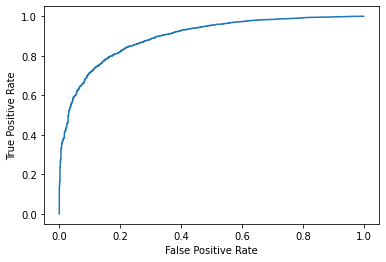

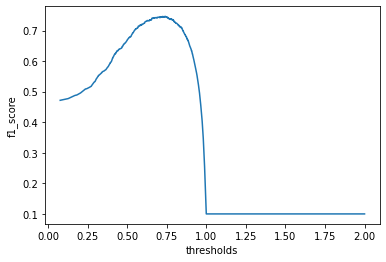

optimum_threshold: 0.7395570415571027
              precision    recall  f1-score   support

           0       0.52      0.60      0.55       899
           1       0.95      0.93      0.94      7186

    accuracy                           0.89      8085
   macro avg       0.73      0.76      0.75      8085
weighted avg       0.90      0.89      0.90      8085

[[ 536  363]
 [ 500 6686]]
f1_score:  0.7466899742146635
roc_auc_score:  0.8955257519332951


In [ ]:
from sklearn.linear_model import LogisticRegression

lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)

get_model_statistics(lr_model, X_test, y_test)

### 1.5.2 Random forest (without DB or HT)

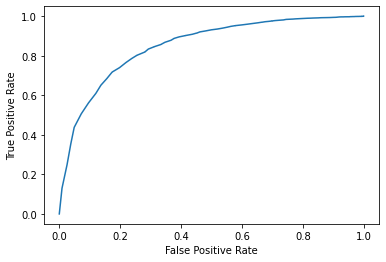

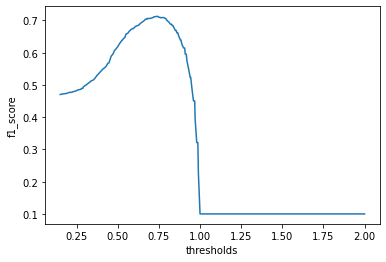

optimum_threshold: 0.74
              precision    recall  f1-score   support

           0       0.46      0.54      0.50       899
           1       0.94      0.92      0.93      7186

    accuracy                           0.88      8085
   macro avg       0.70      0.73      0.71      8085
weighted avg       0.89      0.88      0.88      8085

[[ 484  415]
 [ 570 6616]]
f1_score:  0.7131822345049581
roc_auc_score:  0.8506903950859832


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

get_model_statistics(rf_model, X_test, y_test)

### 1.5.3 XGBoost (without DB or HT)

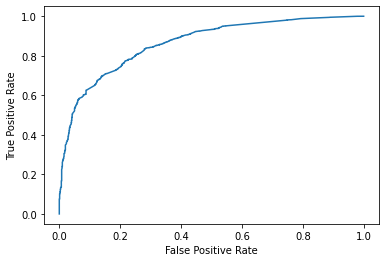

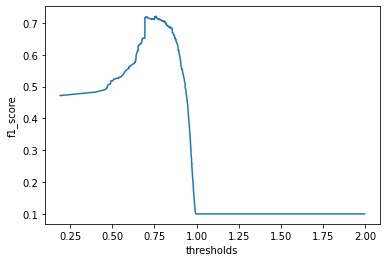

optimum_threshold: 0.7561758
              precision    recall  f1-score   support

           0       0.47      0.55      0.51       899
           1       0.94      0.92      0.93      7186

    accuracy                           0.88      8085
   macro avg       0.71      0.74      0.72      8085
weighted avg       0.89      0.88      0.89      8085

[[ 496  403]
 [ 554 6632]]
f1_score:  0.720842058960132
roc_auc_score:  0.8639483150248585


In [ ]:
import xgboost
from xgboost import XGBClassifier

xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)

get_model_statistics(xgb_model, X_test, y_test)

### 1.5.4 Naive Bayes (without DB or HT)

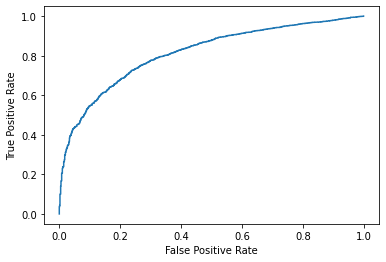

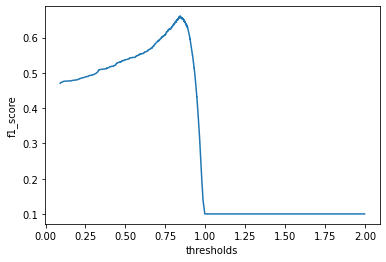

optimum_threshold: 0.8420930813400779
              precision    recall  f1-score   support

           0       0.36      0.48      0.41       899
           1       0.93      0.89      0.91      7186

    accuracy                           0.85      8085
   macro avg       0.64      0.68      0.66      8085
weighted avg       0.87      0.85      0.86      8085

[[ 428  471]
 [ 767 6419]]
f1_score:  0.6604179440141157
roc_auc_score:  0.8139490425549372


In [ ]:
from sklearn.naive_bayes import MultinomialNB

mnb_model = MultinomialNB()
mnb_model.fit(X_train, y_train)

get_model_statistics(mnb_model, X_test, y_test)

- From above we note that we are getting the best results with the Logistic Regression.
- Let's now try to balance both the classes with the help of SMOTE technique and see whether the same gives any imporvement in AUC, F-1 score, etc. of the different model.

In [ ]:
import imblearn
from imblearn.over_sampling import SMOTE

oversample = SMOTE()
# using only train set to inflate the data
X_smote_train, y_smote_train = oversample.fit_resample(X_train, y_train)   

In [ ]:
# chech size of inflated data
print(X_smote_train.shape)
print(y_smote_train.shape)

(33534, 500)
(33534,)


In [ ]:
X_smote_train = pd.DataFrame(X_smote_train, columns=X_train.columns)
y_smote_train = pd.DataFrame(y_smote_train, columns=['label'])

In [ ]:
X_smote_train.head()

,able,absolutely,absolutely love,action,actors,actually,add,ago,almost,also,always,amazing,amount,another,anyone,anything,area,around,around house,away,awesome,awesome movie,baby,back,back old,bad,bag,bathroom,bathrooms,beach,beautiful,best,better,big,bit,black,blue,blue ray,body,bottle,bought,box,brand,brands,bring,bring back,buy,buying,came,canister,car,care,cast,chair,change,changed,characters,children,chili,chips,classic,clay,clean,clean review,cleaner,cleaning,cleans,clear,clorox,clorox disinfecting,clorox products,clorox wines,cm,cocoa,cold,collected,collected part,collection,color,colors,come,comedy,comes,conditioner,convenient,could,counter,counters,couple,cream,daily,dark,daughter,day,days,deal,decent,deep,definitely,did,difference,different,disappointed,disinfect,disinfecting,disinfecting wines,disinfects,done,door,dry,easier,easily,easy,easy clean,easy use,effective,effects,else,end,ends,enjoy,enjoyed,enough,entertaining,entire,especially,even,ever,every,every day,everyday,everyone,everything,everywhere,evil,excellent,excellent product,expected,extra,extremely,face,family,fan,fantastic,far,fast,favorite,feel,feel like,feeling,feels,felt,film,finally,find,fine,first,flavor,flu,formula,found,fragrance,free,fresh,friends,full,fun,funny,funny movie,gel,germ,germs,get,gets,getting,give,gives,glad,go,godzilla,godzilla movie,godzilla movies,goes,going,good,good movie,good product,got,grab,greasy,great,great cleaning,great love,great movie,great price,great product,hair,hand,hands,handy,happy,hard,healthy,heavy,help,helps,high,highly,highly recommend,hilarious,hold,home,hope,horrible,house,hover,however,husband,index,influenster,item,job,keep,keeps,kids,kind,kitchen,kitchen bathroom,know,last,leave,leaves,left,lemon,less,life,light,like,liked,line,lip,lip shimmer,lips,lipstick,little,live,long,long time,longer,look,looked,looking,looks,lot,lotion,lots,love,love clorox,love love,love movie,love product,love smell,love use,love using,love wines,loved,loved movie,loves,low,made,make,makes,making,many,mask,may,mess,messes,minutes,mom,money,monster,monsters,movie,movie good,movie great,movie movie,movies,much,much better,must,natural,need,needed,needs,never,new,new formula,next,nice,night,nothing,of,oil,oily,old,old formula,one,ones,opinions,original,others,overall,part,part promotion,people,perfect,planes,play,please,please bring,plot,plus,powder,power,pretty,price,problem,product,product easy,product great,product love,product review,product use,products,promotion,purchase,purchased,purposes,put,quality,quick,quick clean,quick easy,quickly,quite,ray,real,really,really good,really like,received,received product,recommend,recommend product,recommended,red,remake,resident,resident evil,results,review,review collected,reviews,rice,right,room,roots,said,saw,say,scalp,scenes,scent,school,season,second,see,seems,seen,sequel,series,set,several,shampoo,shampoo conditioner,shimmer,show,shower,since,sink,size,skin,small,smell,smell great,smelling,smells,smells great,smooth,soft,something,son,special,special effects,spray,stars,started,still,store,stores,story,stove,strong,stuff,super,sure,surfaces,take,takes,taste,testing,testing purposes,texture,thank,thanks,thick,thing,things,think,though,thought,time,times,to,together,toilet,took,top,touch,tried,trust,try,trying,type,ups,us,use,use clean,use clorox,use product,use review,use wines,used,uses,using,using clorox,using product,usually,vacuum,value,version,wait,want,wanted,wash,watch,watched,watching,water,way,week,weeks,well,went,white,whole,wines,wines clean,wines convenient,wines easy,wines great,wines love,wines use,wipe,wish,without,wonderful,work,worked,works,works great,works well,worth,would,would recommend,year,year old,years,yet
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [ ]:
# check for any duplicates in X_smote_train

X_smote_train.duplicated().sum()

0

In [ ]:
# check for target label distribution balance
print(y_smote_train.value_counts())

label
1        16767
0        16767
dtype: int64


Training the different models on balanced dataset.

### 1.5.5 Logistic regression (with DB)

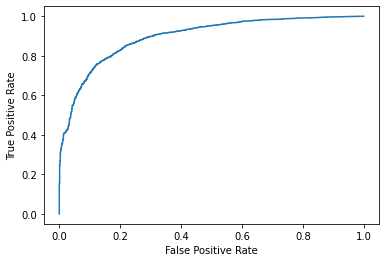

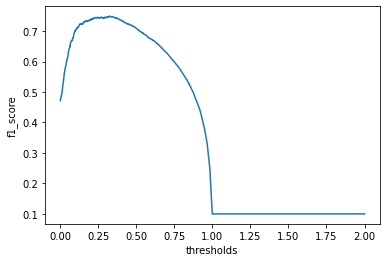

optimum_threshold: 0.3254645358090488
              precision    recall  f1-score   support

           0       0.49      0.66      0.56       899
           1       0.96      0.91      0.93      7186

    accuracy                           0.89      8085
   macro avg       0.72      0.79      0.75      8085
weighted avg       0.90      0.89      0.89      8085

[[ 596  303]
 [ 622 6564]]
f1_score:  0.7486193454625736
roc_auc_score:  0.8962802161042963


In [ ]:
lr_model = LogisticRegression()
lr_model.fit(X_smote_train, y_smote_train)

get_model_statistics(lr_model, X_test, y_test)

### 1.5.6 Random forest (with DB)

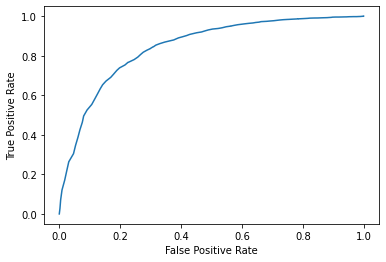

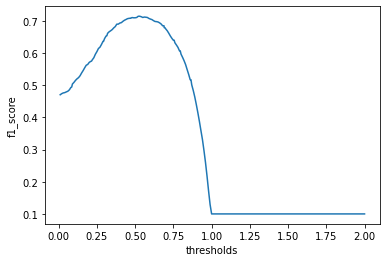

optimum_threshold: 0.53
              precision    recall  f1-score   support

           0       0.48      0.51      0.49       899
           1       0.94      0.93      0.93      7186

    accuracy                           0.88      8085
   macro avg       0.71      0.72      0.71      8085
weighted avg       0.89      0.88      0.89      8085

[[ 459  440]
 [ 498 6688]]
f1_score:  0.7145409094303623
roc_auc_score:  0.8443575553379501


In [ ]:
rf_model = RandomForestClassifier()
rf_model.fit(X_smote_train, y_smote_train)


get_model_statistics(rf_model, X_test, y_test)

### 1.5.7 XGBoost (with DB)

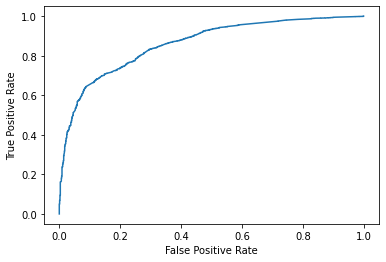

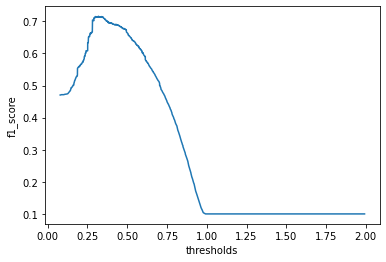

optimum_threshold: 0.31874534
              precision    recall  f1-score   support

           0       0.49      0.50      0.50       899
           1       0.94      0.94      0.94      7186

    accuracy                           0.89      8085
   macro avg       0.72      0.72      0.72      8085
weighted avg       0.89      0.89      0.89      8085

[[ 446  453]
 [ 456 6730]]
f1_score:  0.7160096062498664
roc_auc_score:  0.8608864195520458


In [ ]:
xgb_model = XGBClassifier()
xgb_model.fit(X_smote_train, y_smote_train)


get_model_statistics(xgb_model, X_test, y_test)

### 1.5.8 Naive Bayes (with DB)

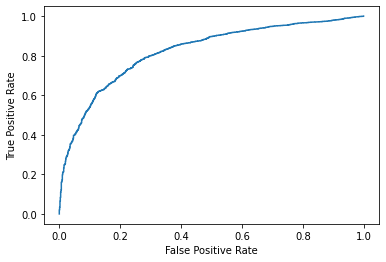

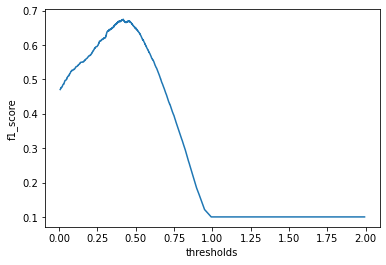

optimum_threshold: 0.41876016735450106
              precision    recall  f1-score   support

           0       0.38      0.51      0.43       899
           1       0.94      0.90      0.92      7186

    accuracy                           0.85      8085
   macro avg       0.66      0.70      0.67      8085
weighted avg       0.87      0.85      0.86      8085

[[ 455  444]
 [ 742 6444]]
f1_score:  0.6749457203852699
roc_auc_score:  0.8232075593780639


In [ ]:
mnb_model = MultinomialNB()
mnb_model.fit(X_smote_train, y_smote_train)

get_model_statistics(mnb_model, X_test, y_test)

We do not see any improvement in average F1-score, AUC after balancing. Hence let's go ahead `without` SMOTE.

In [ ]:
# using stratified splitting
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3, random_state=15, stratify=y)

### 1.5.9 Logistic regression (with HT)

In [ ]:
lr_model = LogisticRegression()
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1]

# define grid search
grid = dict(penalty=penalty,C=c_values)

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

grid_search = GridSearchCV(estimator=lr_model, param_grid=grid, n_jobs=-1,
                       cv=cv, scoring='f1_macro',error_score=0)
grid_result = grid_search.fit(X_train, y_train)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.727648 using {'C': 100, 'penalty': 'l2'}


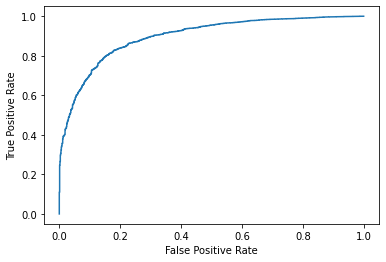

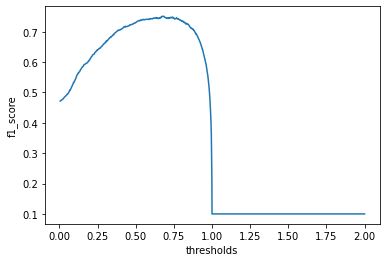

optimum_threshold: 0.6774074632576877
              precision    recall  f1-score   support

           0       0.54      0.59      0.56       899
           1       0.95      0.94      0.94      7186

    accuracy                           0.90      8085
   macro avg       0.74      0.76      0.75      8085
weighted avg       0.90      0.90      0.90      8085

[[ 526  373]
 [ 454 6732]]
f1_score:  0.7510018419315774
roc_auc_score:  0.8976485918268343


In [ ]:
# training on the best obtained parameters
lr_model = LogisticRegression(C=100, penalty='l2')
lr_model.fit(X_train, y_train)

get_model_statistics(lr_model, X_test, y_test)

### 1.5.10 Random forest (with HT)

In [ ]:
'''
Not getting any improvement upon hyperparameter tuning of Random Forest
'''




# rf_model = RandomForestClassifier()

# n_estimators = [10, 100]
# max_features = ['sqrt', 'log2']
# min_samples_leaf = [10,20,30]

# # define grid search
# grid = dict(n_estimators=n_estimators,max_features=max_features, min_samples_leaf=min_samples_leaf)

# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# grid_search = GridSearchCV(estimator=rf_model, param_grid=grid, n_jobs=-1,
#                        cv=cv, scoring='f1_macro',error_score=0)
# grid_result = grid_search.fit(X_train, y_train)

# # summarize results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


# # training on the best obtained parameters
# rf_model = RandomForestClassifier(max_features='sqrt', min_samples_leaf=10,n_estimators=10)
# rf_model.fit(X_train, y_train)

# get_model_statistics(rf_model, X_test, y_test)

### 1.5.11 XGBoost (with HT)

In [ ]:
# not getting any improvement

### 1.5.12 Naive Bayes (with HT)

In [ ]:
# not getting any improvement

From the above exercise, we note that the vanilla Logistic Regression model, without any class imbalance treatment or hyperparameter tuning gives satisfactory results. Hence we go ahead with that for building our final model.

In [ ]:
# deleting some objects to clear the system RAM

del lr_model, rf_model, xgb_model, mnb_model

### Final Model Building

In [46]:
# final sentiment analysis model building

lr_model_final = LogisticRegression()
lr_model_final.fit(X, y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

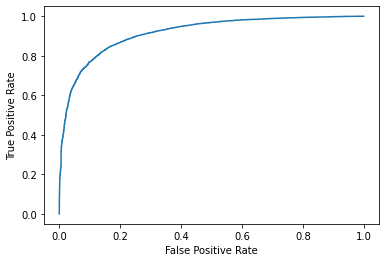

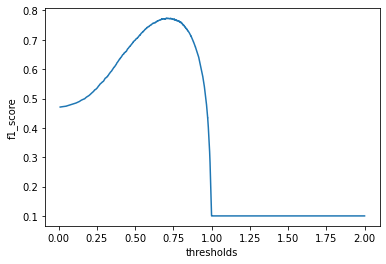

optimum_threshold: 0.7069985444976769
              precision    recall  f1-score   support

           0       0.60      0.60      0.60      2997
           1       0.95      0.95      0.95     23953

    accuracy                           0.91     26950
   macro avg       0.77      0.77      0.77     26950
weighted avg       0.91      0.91      0.91     26950

[[ 1786  1211]
 [ 1199 22754]]
f1_score:  0.7734152273870181
roc_auc_score:  0.9166181795706281


In [47]:
# tuning the model for best F1-score
get_model_statistics(lr_model_final, X, y)

So we use the obtained `optimum_threshold` for classification of labels.

In [48]:
# saving the model for flask application

dump(lr_model_final, 'flask_test_model.joblib')

['flask_test_model.joblib']

## 2. Building a recommendation system

Here we would use following two types of recommendation systems:
- User-based recommendation system
- Item-based recommendation system

We would use the RMSE to select the best out of the above two. But first, let's prepare the data for our recommendation system.

In [21]:
df_main.head(2)

,name,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment
0,Pink Friday: Roman Reloaded Re-Up (w/dvd),5,i love this album. it's very good. more to the...,Just Awesome,joshua,Positive
1,Lundberg Organic Cinnamon Toast Rice Cakes,5,Good flavor. This review was collected as part...,Good,dorothy w,Positive


Here we use `name`,`reviews_username`,`reviews_rating` columns. So we prepare our dataframe accordingly.

In [22]:
df_reco = df_main[['name','reviews_username','reviews_rating']]

In [23]:
# check for null values

df_reco.isnull().sum()

name                 0
reviews_username    63
reviews_rating       0
dtype: int64

In [24]:
# dropping rows with NaN values

df_reco.dropna(axis=0, inplace=True)

In [25]:
# check for duplicates

df_reco.duplicated().sum()

2198

In [26]:
# dropping the duplicates

df_reco.drop_duplicates(inplace=True)

In [27]:
# check for duplicates based on subset of 'name' and 'reviews_username'

df_reco.duplicated(subset=['name','reviews_username']).sum()

151

In [28]:
df_reco[df_reco.duplicated(subset=['name','reviews_username'], keep=False)].sort_values(
    by=['name', 'reviews_rating']).head(11)

,name,reviews_username,reviews_rating
5418,100:Complete First Season (blu-Ray),dontdodat,3
5429,100:Complete First Season (blu-Ray),dontdodat,4
22262,Alex Cross (dvdvideo),mookie,4
22290,Alex Cross (dvdvideo),mookie,5
26450,Aveeno Baby Continuous Protection Lotion Sunsc...,byamazon customer,1
26551,Aveeno Baby Continuous Protection Lotion Sunsc...,byamazon customer,2
26646,Aveeno Baby Continuous Protection Lotion Sunsc...,byamazon customer,5
15028,Avery174 Ready Index Contemporary Table Of Con...,the office guro,3
15045,Avery174 Ready Index Contemporary Table Of Con...,the office guro,4
15053,Avery174 Ready Index Contemporary Table Of Con...,gellis,4


From above we note that we have certain users who have given two or more different ratings to the same products. Let us impute those ratings with the **average** ratings.

In [29]:
# get the average ratings for duplicated rows

df_mean = df_reco[df_reco.duplicated(subset=['name','reviews_username'], keep=False)].groupby(
    by=['name', 'reviews_username']).mean()

df_mean

reviews_rating
name                                               reviews_username                 
100:Complete First Season (blu-Ray)                dontdodat                3.500000
Alex Cross (dvdvideo)                              mookie                   4.500000
Aveeno Baby Continuous Protection Lotion Sunscr... byamazon customer        2.666667
Avery174 Ready Index Contemporary Table Of Cont... gellis                   4.500000
                                                   the office guro          3.500000
...                                                                              ...
Tostitos Bite Size Tortilla Chips                  debb                     4.000000
                                                   rick                     4.500000
                                                   sandy                    3.000000
Windex Original Glass Cleaner Refill 67.6oz (2 ... laura                    1.500000
                                                   suri                     3.500000

[135 rows x 1 columns]

In [30]:
# left merge the df_reco and df_mean dataframes over 'name' and 'reviews_username'

df_merged = df_reco.merge(df_mean, how='left' , on=['name', 'reviews_username']).sort_values(
    by=['name', 'reviews_username'])

df_merged.head()

,name,reviews_username,reviews_rating_x,reviews_rating_y
19543,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,brewno,3,NaN
19545,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,embum,5,NaN
19547,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,granny,5,NaN
19542,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,smokey bear,3,NaN
19546,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,spicesea,5,NaN


In [31]:
df_merged.isnull().sum()

name                    0
reviews_username        0
reviews_rating_x        0
reviews_rating_y    27453
dtype: int64

Since we have very few such rows, we would have many NaN values in `reviews_rating_y` column. Let us concatenate the dataframe such that we get average values from `reviews_rating_y` column and original ratings from `reviews_rating_x` column.

In [32]:
A = df_merged[df_merged['reviews_rating_y'].isnull()][['name','reviews_username','reviews_rating_x']]
A.rename(columns={'reviews_rating_x':'reviews_rating_final'}, inplace=True)

B = df_merged[df_merged['reviews_rating_y'].isnull()==False][['name','reviews_username','reviews_rating_y']]
B.rename(columns={'reviews_rating_y':'reviews_rating_final'}, inplace=True)

df_final= pd.concat([A, B])
df_final.sort_values(by=['name', 'reviews_username'])

,name,reviews_username,reviews_rating_final
19543,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,brewno,3.0
19545,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,embum,5.0
19547,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,granny,5.0
19542,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,smokey bear,3.0
19546,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. ...,spicesea,5.0
...,...,...,...
20525,Yes To Grapefruit Rejuvenating Body Wash,sheila,1.0
20534,Yes To Grapefruit Rejuvenating Body Wash,skeel,4.0
20531,Yes To Grapefruit Rejuvenating Body Wash,td33,3.0
20553,Yes To Grapefruit Rejuvenating Body Wash,trishaxo2u,5.0


In [33]:
# check for duplicates from `df_final` 
df_final.duplicated().sum()

151

In [34]:
# drop duplicates from 'df_final' 

df_final.drop_duplicates(inplace=True)

In [35]:
df_final.name.apply(lambda x:x.lower()).value_counts(dropna=False)

clorox disinfecting wipes value pack scented 150 ct total              7786
godzilla 3d includes digital copy ultraviolet 3d/2d blu-ray/dvd        3148
clorox disinfecting bathroom cleaner                                   1893
planes: fire rescue (2 discs) (includes digital copy) (blu-ray/dvd)    1097
burt's bees lip shimmer, raisin                                         873
                                                                       ... 
progresso traditional chicken rice with vegetables soup                   1
roommates no place like home peel stick wall decals                       1
cal lighting led dark bronze finish metal piano lamp                      1
bodycology nourishing body cream, pretty in paris                         1
pacific natural foods organic beef broth                                  1
Name: name, Length: 271, dtype: int64

From above, we note that there are total 271 different products.

In [36]:
df_final.reviews_username.apply(lambda x:x.lower()).value_counts(dropna=False)

mike         17
lisa         15
chris        13
rick         12
sandy        12
             ..
mgarciatx     1
mfitger       1
mezzo         1
meysaetha     1
suri          1
Name: reviews_username, Length: 24914, dtype: int64

From above, we note that there are 24914 different users.

Now that our dataset is ready. Let up split it into train and test sets and analyse further.

In [37]:
# Test and Train split of the dataset.

train, test = train_test_split(df_final, test_size=0.30, random_state=42)

In [38]:
print(train.shape)
print(test.shape)

(19311, 3)
(8277, 3)


### 2.1 User-based recommendation system

In this method, we find the similarity among different users to find their closeness. We use **Adjusted Cosine** similarity for the same.

Adjusted cosine similarity is a modified version of vector-based similarity where we incorporate the fact that different users have different ratings schemes. In other words, some users might rate items highly in general, and others might give items lower ratings as a preference. To handle this nature from rating given by user, we subtract average ratings for each user from each user's rating for different products.

Let us create a pivot table with index as users, columns as different products and the value in the table as the corresponding rating. Since not every users have rated every products, we would have NaNs in the table. 

In [39]:
# Here, we are not removing the NaN values and calculating the mean 

# Create a user-product matrix.
df_pivot = train.pivot(
    index='reviews_username',
    columns='name',
    values='reviews_rating_final'
)

In [40]:
# Normalising the rating of the movie for each user around 0 mean

mean = np.nanmean(df_pivot, axis=1)
df_subtracted = (df_pivot.T-mean).T

In [41]:
# Creating the User Similarity Matrix using pairwise_distance function.
user_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0
print(user_correlation)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


Here, we are doing the prediction for the users which are positively correlated with other users, and not the users which are negatively correlated. So, ignoring the correlation for values less than 0.

In [42]:
user_correlation[user_correlation<0]=0

Rating predicted by the user (for products rated as well as not rated) is the weighted sum of correlation with the products rating (as present in the rating dataset).

In [43]:
user_predicted_ratings = np.dot(user_correlation, df_pivot.fillna(0))
user_predicted_ratings

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 5.89659573, 0.        , ..., 1.32231073, 0.42640143,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [44]:
user_predicted_ratings.shape

(17848, 258)

#### Evaluation:
For evaulation purpose, we will evaluate for the products already rated by the user instead of predicting it for the products not rated by the user.

In [45]:
# Filter-in the common users from test and train datasets into the test dataset.
common = test[test.reviews_username.isin(train.reviews_username)]
common.shape

(1063, 3)

In [46]:
# convert into the user-product matrix
common_user_based_matrix = common.pivot_table(index='reviews_username', 
                                              columns='name', values='reviews_rating_final')

In [47]:
# Convert the user_correlation matrix into dataframe.
user_correlation_df = pd.DataFrame(user_correlation, 
                                   index= df_subtracted.index,
                                  columns = df_subtracted.index.tolist())
user_correlation_df.head()

,00dog3,00sab00,01impala,02dakota,0325home,06stidriver,09mommy11,1.11E+24,1085,10ten,11111111aaaaaaaaaaaaaaaaa,1143mom,1234,1234561,1234567,1234asdf,123cat123,123charlie,123numbers,123rs,123soccermom,123too,127726,12gage,132457,13ld,13ram,13thfaerie,143st,15425shopper,1616,170361eggs,1943,1970,1992firebirdgirl,19bubba67,1awesome1,1cadet,1chynna,1cleaner,1derpet1,1disappoint,1friendlycat,1gamer,1glenn,1gra,1gussy,1happymom,1healthytot,1izzy1,1jodie,1kindword,1movielover2,1officegal,1okc2thunder3up4,1olaygal,1pleasedclient,1scooby1,1shop,1sonny,1stgrade,1stlady,1sttimemama,1sungirl,1texasmom,1wildbill2l,1witch,2011pink2011,2013bestbuyer,2014bestbuys,2015mom,2016,2016home,2016parker10,2062351337,20crafter16,210tundra,21please,23jen,2455,24hrstoneroses,2532674594,25happyshopper,262jennifer,2689,2827,295259,2athome,2bgreen,2busy4u,2choclabs,2clean4me,2cutekids,2dobies,2ds4es14,2forhokies,2iceskates,2low4zero,2sweetdaisies,2total,2w0cat5z,2xmom,30103,3276teev,37f5p,38redsox,3babiesat41,3bees,3dcav,3dfan,3dknights,3dmoviewatcher,3dpenguin,3dpic,3kids,3lilones,3ringbandb,3ringcircus,3skyyblue,4 rooms 1 dog lotsa fur,4048197640,4112,4141,44pam44,45mindishqueen,4795181377,49erfaithful,49ersfor6,4cloroxl,4djs,4dogmom,4littleones,4momma88,4my5goldens,4parman,4stew57,4theloveofclorox,4wipes,500mpl,50cal,5150seriousshopper5150,530germkiller,54867906,551580,5742870423,5alarm,5boysohmy,5kids,5mcdaniels,5star414,5zenuff,6211958,63lamb,64falcon,66babe,66cutie,6787249844,67firebird,69chopper,7,7.87E+11,70chp,70cohoosier,714reginald,714rv,72443,74corvetteguy,7737593842,79captm79,7rick,80021mom,8023,808wrx,81t21,827,8574178605,85lisa,88brit06,89c46698305f04e39d57a88a2c5c3ce297787288,8bithero,8ellie24,8kucs,8mooshu,8rob1,8sk8anddon8,8thred,9003058363,911notimetoshop,a leaf on the family tree,a11mxdup,a77077,aaaa,aaam,aac06002,aac3,aagbaghagmom,aakon,aalyah,aaron,aaronlab,aaronm,aaube1990,aaulvu,aayla,ab1015,ab45,ab86,abananie,abarker1215,abashli,abaybay,abberdoodlesmom,abbey,abbey64,abbi,abbs77,abbuyguy,abby,abby1,abby8992,abbysmama,abc,abc1245,abc3,abc4sb206,abcd,abcdef,abcdefghij,abcgator,abcssds,abctech,abel9027,abelc,abesb,abf1987,abg0821,abi09,abigail,abigail81,abihaven,abismomy,abm27,abmurals,aboh,about2bmom,abrildiez,abrinegarwky,abruscini,abryant,abuelita,ac228,acadia,acamechis,acarrill93,acasabel,accidbuurn,accounting m,accwiz,acd3,acdd,ace2,acegamer,acehardware,acehi369ja,acelyn,acer,aces,acf11154,achef,achick,achkosh,acidchipmunk,acinom,acjuarez08,acleanerworld,acmillion,acmv,acornnancy,acr2015,actias,actionaction,actionaddict,actortj,acts1123,acurbrider,acv4217,adaizy79,adam,adam1977,adam9976,adamofh,adamsmom,adan,adapters,adash75,adavis,adawg,adballgator,adcaex5,addie,addieb87,addmotherhood25,addto the 2nd degree,adele,adeleforlife,adeline,adelynsmom,adfj21,adi0915,adizzione,adma2,admbat,admin164,admiralake,admirer28,adonis,adpp,adr1ana,adr2,adrbeach,adrbeach27,adrialc,adrian17,adriana,adriana9999,adrianadad,adrianna,adrid,adrienne,adrunkinidiot,adub,adub0222,aduffy,adventurer,adventurousone,advichiel,advocate,adyg,adysonkate,aebt,aebw volunteer,aechking,aeh1021,aeharris,aehr,aei2001,aelw,aeoldham,aep1010,aeroperu,aet39641,afair77,afhaffner,afilii,afooey,afrk,afwifey2003,ag1987,agambrel2118,agard617,agathag,age7,agent 00soul,agent4678,agentcat,agente,agentjelly007,agentnoy,aggie16,aggielily05,agibby722,agmt,agreenlee86,ah87,aharbin88,ahart04,ahaschart,ahawk,ahjohnson1983,ahmedsat,aidensmama 88,aidnel646,aimcoop,aimee,aira,airborneannie,airforce65,airkingchris,airsteve,airwave15,aisha,aiyana84,aj,aj1135,aj2012,aj792008,aj96,ajandjen,ajay,ajeff,ajf9597,ajface24,ajgreer1979,ajhobb07,aji28,ajinak,ajinfl,ajkw,ajmac2000,ajmcoupons,ajoiwejsd,ajpowell,ajrecr,ajskot,ajsmom,ajune,ajvi1201,ajzookie,ak04,ak2008,aka,akathb,akbluemeanie,akcrazymom15,akeane1228,akesler19,aketch,akghwe,akgirl,akgrl,akim,akimh,akimom,akinje,akintola10,akipanda,akirsch,akjones,akmarine86,akmom,aknbak35,akoenke,akpaz81885,akporter84,aktar,aktcharlotte,al,al0000,al09,al31

In [48]:
# filtering-in the user_correlation_df dataframe only those users which are common in both train and test

list_name = common.reviews_username.tolist()

user_correlation_df_1 =  user_correlation_df[user_correlation_df.index.isin(list_name)]
user_correlation_df_2 = user_correlation_df_1.T[user_correlation_df_1.T.index.isin(list_name)]
user_correlation_df_3 = user_correlation_df_2.T

In [49]:
# considering only positive correlations
user_correlation_df_3[user_correlation_df_3<0]=0

In [50]:
# checking the predictions

common_user_predicted_ratings = np.dot(user_correlation_df_3, common_user_based_matrix.fillna(0))
common_user_predicted_ratings

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [51]:
# predicting only for the already rated products
dummy_test = common.copy()
dummy_test['reviews_rating_final'] = dummy_test['reviews_rating_final'].apply(lambda x: 1 if x>=1 else 0)

dummy_test = dummy_test.pivot_table(index='reviews_username', columns='name',
                                    values='reviews_rating_final').fillna(0)

In [52]:
common_user_predicted_ratings = np.multiply(common_user_predicted_ratings,dummy_test)

Calculating the RMSE for only the products already rated by user. For RMSE, normalising the rating to (1,5) range.

In [53]:
X  = common_user_predicted_ratings.copy() 
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

MinMaxScaler(feature_range=(1, 5))


In [54]:
common_ = common.pivot_table(index='reviews_username', columns='name', values='reviews_rating_final')

In [55]:
# Finding total non-NaN value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [56]:
rmse = (np.sum(np.sum((common_ - y)**2))/total_non_nan)**0.5
print(rmse)

2.476841494815289


Above is the RMSE value for using User-based recommendation system.

### 2.2 Item-based recommendation system

In this method, we find the similarity among different items to find their closeness.

In [59]:
df_pivot = train.pivot(
    index='name',
    columns='reviews_username',
    values='reviews_rating_final'
)

df_pivot.head()

reviews_username,00dog3,00sab00,01impala,02dakota,0325home,06stidriver,09mommy11,1.11E+24,1085,10ten,11111111aaaaaaaaaaaaaaaaa,1143mom,1234,1234561,1234567,1234asdf,123cat123,123charlie,123numbers,123rs,123soccermom,123too,127726,12gage,132457,13ld,13ram,13thfaerie,143st,15425shopper,1616,170361eggs,1943,1970,1992firebirdgirl,19bubba67,1awesome1,1cadet,1chynna,1cleaner,1derpet1,1disappoint,1friendlycat,1gamer,1glenn,1gra,1gussy,1happymom,1healthytot,1izzy1,1jodie,1kindword,1movielover2,1officegal,1okc2thunder3up4,1olaygal,1pleasedclient,1scooby1,1shop,1sonny,1stgrade,1stlady,1sttimemama,1sungirl,1texasmom,1wildbill2l,1witch,2011pink2011,2013bestbuyer,2014bestbuys,2015mom,2016,2016home,2016parker10,2062351337,20crafter16,210tundra,21please,23jen,2455,24hrstoneroses,2532674594,25happyshopper,262jennifer,2689,2827,295259,2athome,2bgreen,2busy4u,2choclabs,2clean4me,2cutekids,2dobies,2ds4es14,2forhokies,2iceskates,2low4zero,2sweetdaisies,2total,2w0cat5z,2xmom,30103,3276teev,37f5p,38redsox,3babiesat41,3bees,3dcav,3dfan,3dknights,3dmoviewatcher,3dpenguin,3dpic,3kids,3lilones,3ringbandb,3ringcircus,3skyyblue,4 rooms 1 dog lotsa fur,4048197640,4112,4141,44pam44,45mindishqueen,4795181377,49erfaithful,49ersfor6,4cloroxl,4djs,4dogmom,4littleones,4momma88,4my5goldens,4parman,4stew57,4theloveofclorox,4wipes,500mpl,50cal,5150seriousshopper5150,530germkiller,54867906,551580,5742870423,5alarm,5boysohmy,5kids,5mcdaniels,5star414,5zenuff,6211958,63lamb,64falcon,66babe,66cutie,6787249844,67firebird,69chopper,7,7.87E+11,70chp,70cohoosier,714reginald,714rv,72443,74corvetteguy,7737593842,79captm79,7rick,80021mom,8023,808wrx,81t21,827,8574178605,85lisa,88brit06,89c46698305f04e39d57a88a2c5c3ce297787288,8bithero,8ellie24,8kucs,8mooshu,8rob1,8sk8anddon8,8thred,9003058363,911notimetoshop,a leaf on the family tree,a11mxdup,a77077,aaaa,aaam,aac06002,aac3,aagbaghagmom,aakon,aalyah,aaron,aaronlab,aaronm,aaube1990,aaulvu,aayla,ab1015,ab45,ab86,abananie,abarker1215,abashli,abaybay,abberdoodlesmom,abbey,abbey64,abbi,abbs77,abbuyguy,abby,abby1,abby8992,abbysmama,abc,abc1245,abc3,abc4sb206,abcd,abcdef,abcdefghij,abcgator,abcssds,abctech,abel9027,abelc,abesb,abf1987,abg0821,abi09,abigail,abigail81,abihaven,abismomy,abm27,abmurals,aboh,about2bmom,abrildiez,abrinegarwky,abruscini,abryant,abuelita,ac228,acadia,acamechis,acarrill93,acasabel,accidbuurn,accounting m,accwiz,acd3,acdd,ace2,acegamer,acehardware,acehi369ja,acelyn,acer,aces,acf11154,achef,achick,achkosh,acidchipmunk,acinom,acjuarez08,acleanerworld,acmillion,acmv,acornnancy,acr2015,actias,actionaction,actionaddict,actortj,acts1123,acurbrider,acv4217,adaizy79,adam,adam1977,adam9976,adamofh,adamsmom,adan,adapters,adash75,adavis,adawg,adballgator,adcaex5,addie,addieb87,addmotherhood25,addto the 2nd degree,adele,adeleforlife,adeline,adelynsmom,adfj21,adi0915,adizzione,adma2,admbat,admin164,admiralake,admirer28,adonis,adpp,adr1ana,adr2,adrbeach,adrbeach27,adrialc,adrian17,adriana,adriana9999,adrianadad,adrianna,adrid,adrienne,adrunkinidiot,adub,adub0222,aduffy,adventurer,adventurousone,advichiel,advocate,adyg,adysonkate,aebt,aebw volunteer,aechking,aeh1021,aeharris,aehr,aei2001,aelw,aeoldham,aep1010,aeroperu,aet39641,afair77,afhaffner,afilii,afooey,afrk,afwifey2003,ag1987,agambrel2118,agard617,agathag,age7,agent 00soul,agent4678,agentcat,agente,agentjelly007,agentnoy,aggie16,aggielily05,agibby722,agmt,agreenlee86,ah87,aharbin88,ahart04,ahaschart,ahawk,ahjohnson1983,ahmedsat,aidensmama 88,aidnel646,aimcoop,aimee,aira,airborneannie,airforce65,airkingchris,airsteve,airwave15,aisha,aiyana84,aj,aj1135,aj2012,aj792008,aj96,ajandjen,ajay,ajeff,ajf9597,ajface24,ajgreer1979,ajhobb07,aji28,ajinak,ajinfl,ajkw,ajmac2000,ajmcoupons,ajoiwejsd,ajpowell,ajrecr,ajskot,ajsmom,ajune,ajvi1201,ajzookie,ak04,ak2008,aka,akathb,akbluemeanie,akcrazymom15,akeane1228,akesler19,aketch,akghwe,akgirl,akgrl,akim,akimh,akimom,akinje,akintola10,akipanda,akirsch,akjones,akmarine86,akmom,aknbak35,akoenke,akpaz81885,akporter84,aktar,aktcharlotte,al,

Normalising the product rating for each products for using the Adujsted Cosine

In [60]:
mean = np.nanmean(df_pivot, axis=1)
df_subtracted = (df_pivot.T-mean).T

In [61]:
# Finding the cosine similarity using pairwise distances approach

# Item Similarity Matrix
item_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
item_correlation[np.isnan(item_correlation)] = 0

In [62]:
# Filtering-in the correlation only for which the value is greater than 0. (Positively correlated)

item_correlation[item_correlation<0]=0

In [63]:
# predicting for all users for all items
item_predicted_ratings = np.dot((df_pivot.fillna(0).T), item_correlation)

#### Evaluation 

In [64]:
# gathering products in test dataset which are also there in the train dataset
common =  test[test.name.isin(train.name)]
common.shape

(8261, 3)

In [65]:
common_item_based_matrix = common.pivot_table(index='name', 
                                              columns='reviews_username', values='reviews_rating_final')

In [66]:
item_correlation_df = pd.DataFrame(item_correlation, index=df_subtracted.index,
                                  columns=df_subtracted.index.tolist())

In [67]:
# filtering-in the common products
list_name = common.name.tolist()

item_correlation_df_1 =  item_correlation_df[item_correlation_df.index.isin(list_name)]
item_correlation_df_2 = item_correlation_df_1.T[item_correlation_df_1.T.index.isin(list_name)]
item_correlation_df_3 = item_correlation_df_2.T

In [68]:
# predicting ratings by the different users
item_correlation_df_3[item_correlation_df_3<0]=0
common_item_predicted_ratings = np.dot(item_correlation_df_3, common_item_based_matrix.fillna(0))
common_item_predicted_ratings


array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.20005227e-02, 5.00000000e+00, 0.00000000e+00, ...,
        2.43778062e-02, 2.43778062e-02, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 7.65843900e-03, ...,
        0.00000000e+00, 0.00000000e+00, 5.38182220e-03],
       [3.52165315e-03, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 8.32868199e-03],
       [1.44770201e-02, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

Dummy test will be used for evaluation. To evaluate, we will only make prediction on the products already rated by the user. So, this is marked as 1.

In [69]:
dummy_test = common.copy()

dummy_test['reviews_rating_final'] = dummy_test['reviews_rating_final'].apply(lambda x: 1 if x>=1 else 0)

dummy_test = dummy_test.pivot_table(index='reviews_username', 
                                    columns='name', values='reviews_rating_final').T.fillna(0)

common_item_predicted_ratings = np.multiply(common_item_predicted_ratings,dummy_test)

The products not rated is marked as 0 for evaluation. And make the item- item matrix representaion

In [70]:
common_ = common.pivot_table(index='reviews_username', columns='name', values='reviews_rating_final').T

In [71]:
X  = common_item_predicted_ratings.copy() 
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)

MinMaxScaler(feature_range=(1, 5))
[[nan nan nan ... nan nan nan]
 [nan  1. nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


In [72]:
total_non_nan = np.count_nonzero(~np.isnan(y))

In [73]:
rmse = (np.sum(np.sum((common_ - y )**2))/total_non_nan)**0.5
print(rmse)

3.570188548321847


From above we note that **User-based recommendation system** is working better for our dataset. So let's go ahead with the same.

### Final recommendation building based on User-based collaborative filtering

In [67]:
# Pivot the train ratings' dataset into matrix format in which columns are products and the rows are user IDs.
df_pivot = df_final.pivot(
    index='reviews_username',
    columns='name',
    values='reviews_rating_final'
).fillna(0)

In [68]:
# subtracting mean user ratings
mean = np.nanmean(df_pivot, axis=1)
df_subtracted = (df_pivot.T-mean).T

In [69]:
# Creating the User Similarity Matrix using pairwise_distance function.
from sklearn.metrics.pairwise import pairwise_distances
user_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0
print(user_correlation)

[[ 1.         -0.00469007 -0.0037037  ... -0.0037037  -0.0037037
  -0.0037037 ]
 [-0.00469007  1.         -0.00469007 ... -0.00469007  0.94856663
  -0.00469007]
 [-0.0037037  -0.00469007  1.         ... -0.0037037  -0.0037037
  -0.0037037 ]
 ...
 [-0.0037037  -0.00469007 -0.0037037  ...  1.         -0.0037037
   1.        ]
 [-0.0037037   0.94856663 -0.0037037  ... -0.0037037   1.
  -0.0037037 ]
 [-0.0037037  -0.00469007 -0.0037037  ...  1.         -0.0037037
   1.        ]]


In [70]:
# only considering the positively correlated uers
user_correlation[user_correlation<0]=0

In [71]:
# predicting 
user_predicted_ratings = np.dot(user_correlation, (df_pivot.fillna(0)))

In [72]:
user_predicted_ratings

array([[ 0.        ,  0.        ,  0.        , ...,  1.52325296,
         0.        ,  0.        ],
       [ 0.        ,  2.97805115,  0.        , ..., 20.05330829,
         4.64678129,  1.14169309],
       [ 0.        , 39.43567323,  0.        , ..., 29.5162313 ,
         1.8076117 ,  2.94021339],
       ...,
       [ 0.        , 10.21840209,  0.        , ..., 18.27264927,
         2.30551641,  0.        ],
       [ 0.        ,  0.73217701,  0.        , ..., 16.41778396,
         4.91331056,  1.02453718],
       [ 0.        , 10.21840209,  0.        , ..., 18.27264927,
         2.30551641,  0.        ]])

In [73]:
# getting the prediction in the range 1 to 5

scaler = MinMaxScaler(feature_range=(1, 5))
user_predicted_ratings = scaler.fit_transform(user_predicted_ratings)
user_predicted_ratings

array([[1.        , 1.        , 1.        , ..., 1.00487371, 1.        ,
        1.        ],
       [1.        , 1.02081673, 1.        , ..., 1.06416134, 1.06689763,
        1.03203486],
       [1.        , 1.27565736, 1.        , ..., 1.09443832, 1.02602338,
        1.08249969],
       ...,
       [1.        , 1.07142715, 1.        , ..., 1.05846405, 1.03319149,
        1.        ],
       [1.        , 1.00511795, 1.        , ..., 1.05252933, 1.07073473,
        1.02874757],
       [1.        , 1.07142715, 1.        , ..., 1.05846405, 1.03319149,
        1.        ]])

Since we are interested only in the products not rated by the user, we will ignore the products rated by the user by making it zero.

In [74]:
# Copy the train dataset into dummy_train
dummy_train = df_final.copy()

In [75]:
# The product not rated by user is marked as 1 for prediction. 
dummy_train['reviews_rating_final'] = dummy_train['reviews_rating_final'].apply(lambda x: 0 if x>=1 else 1)

In [76]:
# Convert the dummy train dataset into matrix format.
dummy_train = dummy_train.pivot(
    index='reviews_username',
    columns='name',
    values='reviews_rating_final'
).fillna(1)

In [77]:
user_final_rating = np.multiply(user_predicted_ratings,dummy_train)
user_final_rating.head()

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz","42 Dual Drop Leaf Table with 2 Madrid Chairs""",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Black Sister's Revenge (dvd),Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Cal Lighting Led Dark Bronze Finish Metal Piano Lamp,Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,"Carson-Dellosa Publishing Photographic Learning Cards Boxed Set, Nouns/verbs/adjectives, Grades K-12",Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Citrus Magic Instant Spot & Stain Remover,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Clorox Ultimate Care Premium Bleach,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Disney174 Jake And The Neverland Pirates 4 Piece Bedding Set - Toddler,Doc Mcstuffins:

In [78]:
# saving rating model for Flask application
dump(user_final_rating, 'user_final_rating_model.joblib')

['user_final_rating_model.joblib']

## Final prediction

In [79]:
user_input = '02deuce'  #sample case 

d = user_final_rating.loc[user_input].sort_values(ascending=False)[0:20]
d

name
Noosa Honey Yogurt                                                                3.300832
Progresso Traditional Chicken Rice With Vegetables Soup                           3.300832
Olivella Bar Soap - 3.52 Oz                                                       3.053782
Wagan Smartac 80watt Inverter With Usb                                            2.487549
Chips Deluxe Soft 'n Chewy Cookies                                                2.406728
Naturtint Nutrideep Multiplier Protective Cream                                   2.036149
Batherapy Natural Mineral Bath Sport Liquid, 16 oz                                2.028375
Beanitos Bean Chips, Simply Pinto Bean                                            1.988915
Various - Country's Greatest Gospel:Gold Ed (cd)                                  1.978176
Newman's Own Organics Licorice Twist, Black 5oz                                   1.911627
Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan                       1.8

In [80]:
mean_sentiment_score_ = []
for product in d.index:
    prod_score = 0
    total_reviews_per_product = float(len(df_main[(df_main.name==product)].index))
    for indx in df_main[(df_main.name==product)].index.tolist():
        # let's do exception handling as we have droppped few rows as well
        try:
            inp = vectorizer.transform([df_main['text_concat'][indx]]).toarray()
            senti_prediction = float(lr_model_final.predict(inp))
            prod_score+=senti_prediction
        except:
            pass
    mean_sentiment_score_.append((product,prod_score/ total_reviews_per_product))

In [81]:
mean_sentiment_score_

[('Noosa Honey Yogurt', 1.0),
 ('Progresso Traditional Chicken Rice With Vegetables Soup', 0.0),
 ('Olivella Bar Soap - 3.52 Oz', 0.6666666666666666),
 ('Wagan Smartac 80watt Inverter With Usb', 0.8),
 ("Chips Deluxe Soft 'n Chewy Cookies", 1.0),
 ('Naturtint Nutrideep Multiplier Protective Cream', 1.0),
 ('Batherapy Natural Mineral Bath Sport Liquid, 16 oz', 0.5),
 ('Beanitos Bean Chips, Simply Pinto Bean', 0.75),
 ("Various - Country's Greatest Gospel:Gold Ed (cd)", 1.0),
 ("Newman's Own Organics Licorice Twist, Black 5oz", 0.8333333333333334),
 ('Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan', 1.0),
 ('Cetaphil Gentle Skin Cleanser, 2oz', 1.0),
 ('D-Con Mice Bait Station - 3ct', 0.8571428571428571),
 ('Sea Gull Lighting Six Light Bath Sconce/vanity - Brushed Nickel', 1.0),
 ('Cantu Coconut Milk Shine Hold Mist - 8oz', 0.75),
 ('Lynk Professional174 Pull Out Cutting Board Bakeware Sliding Cabinet Organizer',
  1.0),
 ("Nearly Natural 5.5' Bamboo W/decorative Planter", 1

In [82]:
print('Top 5 recommendations for username %s are as under:'%user_input)
[i[0] for i in sorted(mean_sentiment_score_, key = lambda x: x[1], reverse=True)[:5]]

Top 5 recommendations for username 02deuce are as under:


['Noosa Honey Yogurt',
 "Chips Deluxe Soft 'n Chewy Cookies",
 'Naturtint Nutrideep Multiplier Protective Cream',
 "Various - Country's Greatest Gospel:Gold Ed (cd)",
 'Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan']

---------------------------------------------------------------------------------------------------------------